In [1]:
%load_ext autoreload
%autoreload 2
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:96% !important; }</style>"))

import os
import torch
import matplotlib.pyplot as plt
from skimage.io import imread
import torch.nn as nn
import numpy as np
from skimage import img_as_ubyte
import imageio
import json
import cv2
import time
from PIL import Image
from pytorch3d.loss import (
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
)
from torch.optim.lr_scheduler import ReduceLROnPlateau

import torch.nn.functional as F

from tqdm import tqdm_notebook
# Util function for loading meshes
from pytorch3d.io import load_objs_as_meshes, load_obj
import math
# Data structures and functions for rendering
from pytorch3d.structures import Meshes, Textures, join_meshes_as_batch
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras, 
    SfMPerspectiveCameras,
    SfMOrthographicCameras,
    PointLights, 
    BlendParams,
    DirectionalLights,
    Materials, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    TexturedSoftPhongShader,
    SoftSilhouetteShader,
    look_at_rotation,
    HardFlatShader
)

# add path for demo utils functions 
import sys
import os
import glob
sys.path.append(os.path.abspath(''))

print(torch.version.cuda)
from datetime import datetime
print(torch.__version__)

9.2
1.4.0


In [72]:
# input texturemap
#in_tex = r'D:\1_Projects\200325_PyTorch3d_Projects\21_data\200613_7_singleFrame_L1_noReg\texturemap.npy'
in_tex = r'D:\1_Projects\200325_PyTorch3d_Projects\21_data\200613_6_singleFrame_L2_noReg\texturemap.npy'
#in_hot_pixels = r'D:\1_Projects\200325_PyTorch3d_Projects\22_data\200613_2_L1_noReg\texturemap.npy'
in_hot_pixels = r'D:\1_Projects\200325_PyTorch3d_Projects\22_data\200613_3_L2_noReg\texturemap.npy'


texturemap = np.clip(np.load(in_tex).squeeze(), a_min=0, a_max=1)
hot_pixels = np.load(in_hot_pixels).squeeze()
hot_pixels = (hot_pixels - np.min(hot_pixels)) / (np.max(hot_pixels) - np.min(hot_pixels))
print(np.min(hot_pixels), np.max(hot_pixels))
hot_pixels = (hot_pixels > 0.5).astype(np.float32)
hot_pixels_bool = hot_pixels > 0
print(np.sum(hot_pixels), np.sum(hot_pixels_bool), ' hot pixels')


print(texturemap.shape, hot_pixels.shape, texturemap.dtype, hot_pixels.dtype)

0.0 1.0
98534.0 98534  hot pixels
(1024, 1024) (1024, 1024) float32 float32


# binarize hot pixels

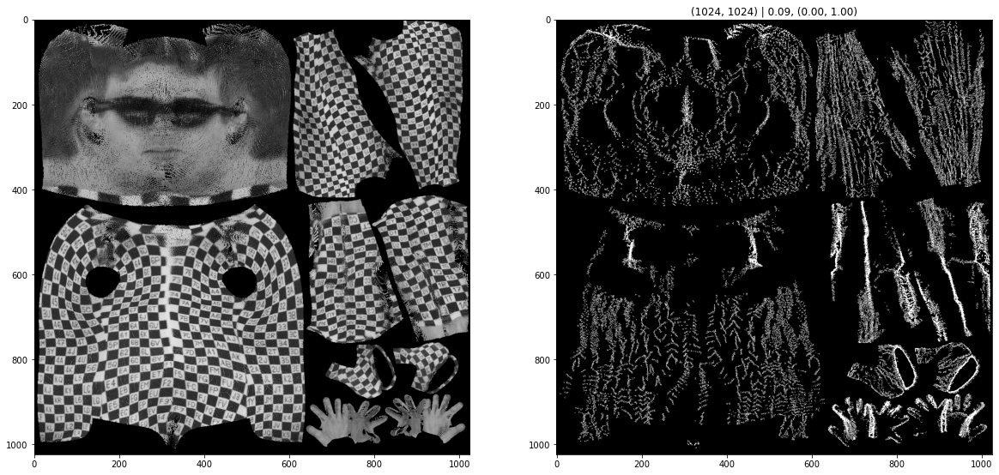

In [73]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(texturemap, cmap='gray')
ax[1].imshow(hot_pixels, cmap='gray', vmin=0, vmax=1)
ax[1].set_title('{} | {:.2f}, ({:.2f}, {:.2f})'.format(hot_pixels.shape, np.mean(hot_pixels), np.min(hot_pixels), np.max(hot_pixels)))
plt.show()

# kernel

In [74]:
smooth_kernel = np.float32([[1, 1, 1], [1, 0, 1], [1, 1, 1]])
smooth_kernel /= np.sum(smooth_kernel)

texturemap2 = texturemap.copy()
for i in range(2):
    for r in range(texturemap.shape[0]):
        if r == 0:
            continue
        for c in range(texturemap.shape[1]):
            if c == 0:
                continue
            if hot_pixels_bool[r, c]:
                window = texturemap2[r-1:r+2, c-1:c+2]
                texturemap2[r, c] = np.sum(smooth_kernel*window)
            else:
                continue
print('Done')

Done


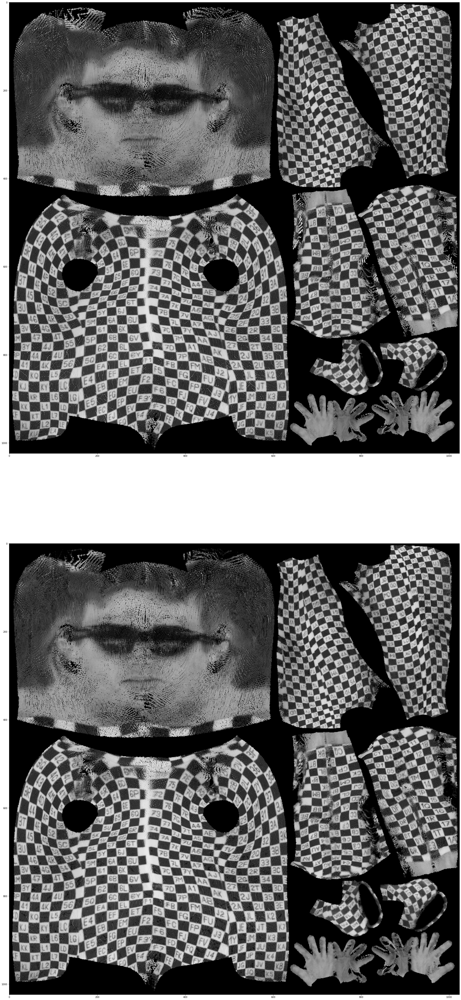

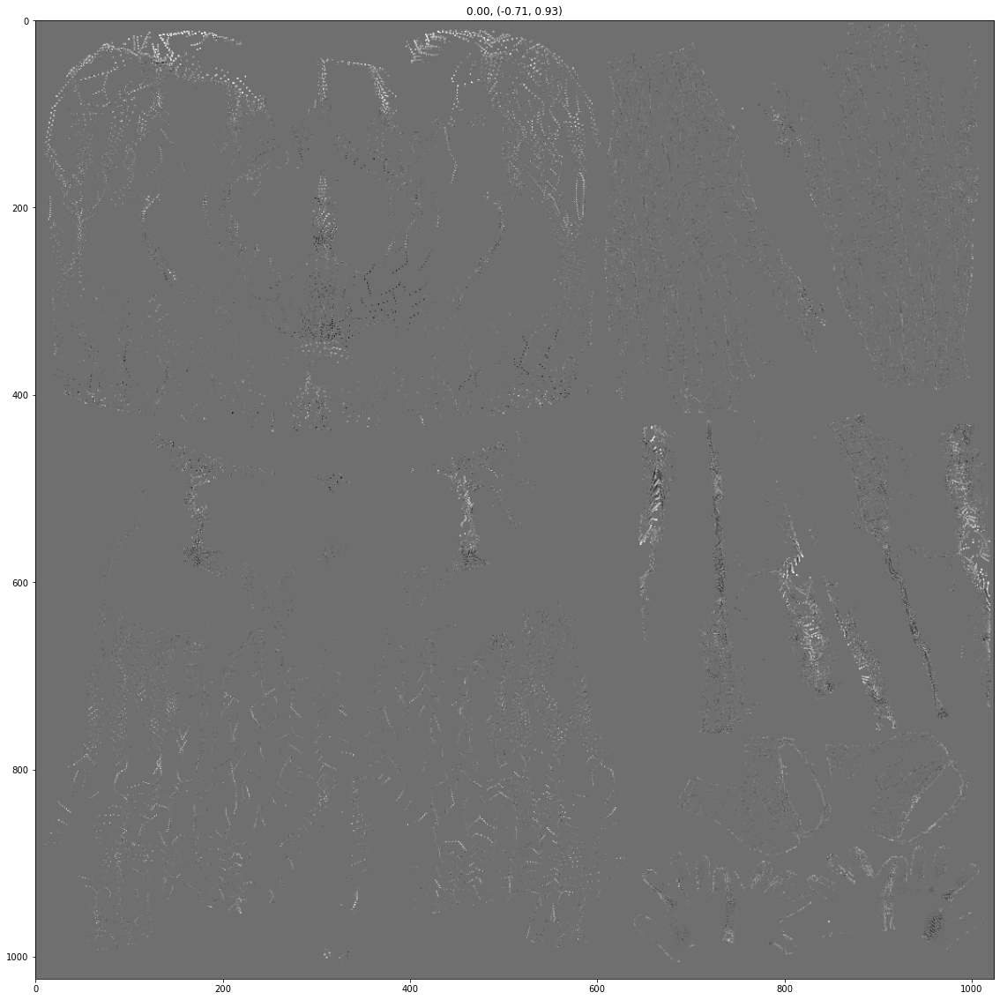

In [75]:
fig, ax = plt.subplots(2, 1, figsize=(40, 80))
ax[0].imshow(texturemap, cmap='gray')
ax[1].imshow(texturemap2, cmap='gray')
plt.show()

diff = texturemap-texturemap2
plt.figure(figsize=(20, 20))
plt.imshow(diff, cmap='gray')
plt.title('{:.2f}, ({:.2f}, {:.2f})'.format(np.mean(diff), np.min(diff), np.max(diff)))
plt.show()